In [2]:
import ultralytics
import gdown
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd

                                          ID  habitats  labels classes  \
0                      valid/7623_F2_f000460      7623       1   valid   
1                     empty/7585_NF2_f000230      7585       0   empty   
2                     empty/7434_NF3_f000160      7434       0   empty   
3                     empty/7585_NF2_f000160      7585       0   empty   
4  valid/9866_acanthopagrus_palmaris_f000030      9866       1   valid   

                                frames  
0                      7623_F2_f000460  
1                     7585_NF2_f000230  
2                     7434_NF3_f000160  
3                     7585_NF2_f000160  
4  9866_acanthopagrus_palmaris_f000030  
Index(['ID', 'habitats', 'labels', 'classes', 'frames'], dtype='object')
Image Path: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model\images\valid\7623_F2_f000460.jpg
Mask Path: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model\masks\valid\7623_F2_f000

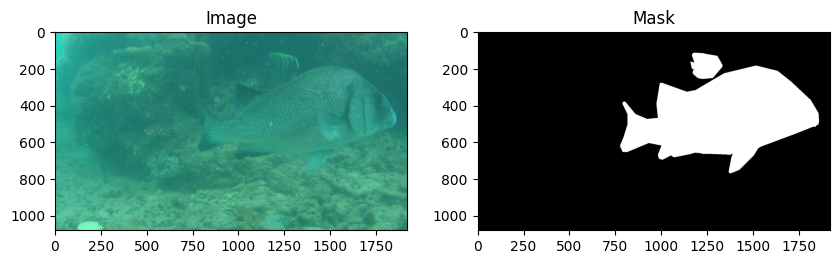

In [30]:
#1. Loading and looking at data

import os
import matplotlib.pyplot as plt
import cv2
import pandas as pd

# Set the base directory and the paths for images and masks
base_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model'
images_dir = os.path.join(base_dir, 'images')
masks_dir = os.path.join(base_dir, 'masks')
train_csv = os.path.join(base_dir, 'train.csv')

# Load the train CSV to inspect the file structure
train_df = pd.read_csv(train_csv)

# Check the content of the DataFrame
print(train_df.head())  # Display the first few rows for verification
print(train_df.columns)  # Check the columns available

# Function to display image and mask
def visualize_image_and_mask(image_path, mask_path):
    # Load the image and mask
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, 0)  # Load mask in grayscale
    
    # Display the image and mask side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Image')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Mask')
    
    plt.show()

# Example: Visualize a sample image and mask
sample_row = train_df.iloc[0]

# Extracting the necessary components from the sample row
# Assuming 'ID' has format 'class/filename' e.g. 'valid/7623'
class_label, filename = sample_row['ID'].split('/')
mask_filename = f"{filename}.png"  # Assuming mask files are named similarly but with .png

# Construct paths with category (subdirectory) included
image_path = os.path.join(images_dir, class_label, f"{filename}.jpg")  # Change to .jpg if needed
mask_path = os.path.join(masks_dir, class_label, mask_filename)

# Print paths for debugging
print(f"Image Path: {image_path}")
print(f"Mask Path: {mask_path}")

# Visualize the image and mask
visualize_image_and_mask(image_path, mask_path)


Skipping malformed annotation: 1 0.637599093997735 0.9932049830124574 0.637599093997735 0.9920724801812003 0.638731596828992 0.9909399773499434 0.6353340883352209 0.9909399773499434 0.637599093997735 0.9932049830124574
Skipping malformed annotation: 1 0.49603624062499996 0.966024915625 0.49830124531250003 0.966024915625 0.49830124531250003 0.9648924125 0.4971687421875 0.963759909375 0.49603624062499996 0.9648924125 0.49603624062499996 0.966024915625
Skipping malformed annotation: 1 0.4099660249150623 0.9433748584371461 0.4133635334088335 0.9433748584371461 0.41223103057757643 0.942242355605889 0.4099660249150623 0.942242355605889 0.4099660249150623 0.9433748584371461
Skipping malformed annotation: 1 0.4371460921875 0.9343148359375 0.436013590625 0.9331823328125 0.4348810875 0.9331823328125 0.4348810875 0.9343148359375 0.4371460921875 0.9343148359375
Skipping malformed annotation: 1 0.39071347678369195 0.9320498301245752 0.39184597961494905 0.9320498301245752 0.3929784824462061 0.933182

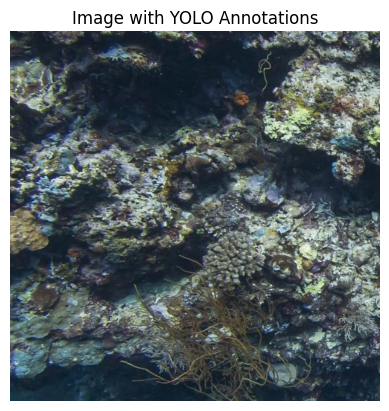

In [31]:
#2. YOLO SETUP and
# Example of visualizing a specific YOLO annotation

# Set the base directories for YOLO images and labels
yolo_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLO8/train/images/'
yolo_labels_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLO8/train/labels/'

def visualize_yolo_annotations(image_file):
    # Build the complete paths for image and corresponding label
    image_path = os.path.join(yolo_images_dir, image_file)
    label_path = os.path.join(yolo_labels_dir, image_file.replace('.jpg', '.txt'))  # Change .jpg to .txt for label file

    # Check if the image and label files exist
    if not os.path.isfile(image_path):
        print(f"Image file not found: {image_path}")
        return

    if not os.path.isfile(label_path):
        print(f"Label file not found: {label_path}")
        return

    # Load the image
    image = cv2.imread(image_path)

    # Read the YOLO annotations
    with open(label_path, 'r') as f:
        annotations = f.readlines()

    # Draw bounding boxes on the image
    for annotation in annotations:
        values = annotation.split()
        if len(values) != 5:  # Ensure there are exactly 5 values
            print(f"Skipping malformed annotation: {annotation.strip()}")
            continue  # Skip malformed lines
        
        class_id, x_center, y_center, width, height = map(float, values)

        # Convert YOLO format (normalized) to pixel values
        img_height, img_width = image.shape[:2]
        x_center = int(x_center * img_width)
        y_center = int(y_center * img_height)
        width = int(width * img_width)
        height = int(height * img_height)

        # Calculate the top-left corner of the bounding box
        x1 = x_center - width // 2
        y1 = y_center - height // 2
        x2 = x_center + width // 2
        y2 = y_center + height // 2

        # Draw the bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue color in BGR

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title('Image with YOLO Annotations')
    plt.show()

# Example of visualizing a specific YOLO annotation
visualize_yolo_annotations('26009010301_jpg.rf.f33658ce8fd406081146b82ae8967acd.jpg')


Skipping malformed annotation: 1 0.637599093997735 0.9932049830124574 0.637599093997735 0.9920724801812003 0.638731596828992 0.9909399773499434 0.6353340883352209 0.9909399773499434 0.637599093997735 0.9932049830124574
Skipping malformed annotation: 1 0.49603624062499996 0.966024915625 0.49830124531250003 0.966024915625 0.49830124531250003 0.9648924125 0.4971687421875 0.963759909375 0.49603624062499996 0.9648924125 0.49603624062499996 0.966024915625
Skipping malformed annotation: 1 0.4099660249150623 0.9433748584371461 0.4133635334088335 0.9433748584371461 0.41223103057757643 0.942242355605889 0.4099660249150623 0.942242355605889 0.4099660249150623 0.9433748584371461
Skipping malformed annotation: 1 0.4371460921875 0.9343148359375 0.436013590625 0.9331823328125 0.4348810875 0.9331823328125 0.4348810875 0.9343148359375 0.4371460921875 0.9343148359375
Skipping malformed annotation: 1 0.39071347678369195 0.9320498301245752 0.39184597961494905 0.9320498301245752 0.3929784824462061 0.933182

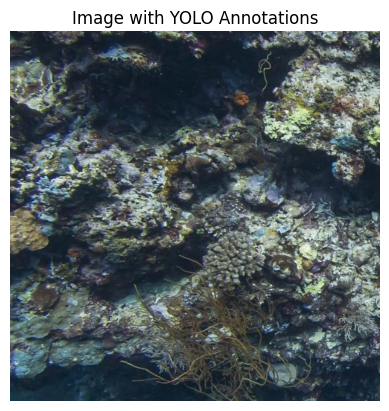

In [20]:
# Example of visualizing a specific YOLO annotation
visualize_yolo_annotations('26009010301_jpg.rf.f33658ce8fd406081146b82ae8967acd.jpg')  

In [33]:
# Contents of data.yaml file

import yaml

# Load the data.yaml file
yaml_file_path = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml'

with open(yaml_file_path, 'r') as f:
    data = yaml.safe_load(f)

# Print the contents
print("Training Data Path:", data['train'])
print("Validation Data Path:", data['val'])
print("Number of Classes:", data['nc'])
print("Class Names:", data['names'])


Training Data Path: ../train/images
Validation Data Path: ../valid/images
Number of Classes: 1
Class Names: ['Fish']


In [24]:
#3. Convert Segmentation Masks to YOLO Format
#? The YOLO format has bounding boxes already? - yes

import os
import cv2
import pandas as pd

# Set the directories
images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/images'
masks_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/masks'
yolo_labels_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLO8/train/labels'

# Load the train CSV
train_csv = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/train.csv'
train_df = pd.read_csv(train_csv)

# Function to convert segmentation masks to YOLO format
def convert_masks_to_yolo_format(image_id, mask_image_path):
    # Load the mask image
    mask = cv2.imread(mask_image_path, cv2.IMREAD_GRAYSCALE)

    # Find contours from the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    yolo_annotations = []
    for contour in contours:
        # Get bounding box from contour
        x, y, w, h = cv2.boundingRect(contour)
        # Calculate YOLO format
        x_center = (x + w / 2) / mask.shape[1]
        y_center = (y + h / 2) / mask.shape[0]
        width = w / mask.shape[1]
        height = h / mask.shape[0]
        # Assuming class ID is determined by the 'labels' column in the train_df
        class_id = train_df[train_df['ID'] == image_id]['labels'].values[0]
        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_annotations

# Convert masks for each image in the dataset
for index, row in train_df.iterrows():
    image_id = row['ID'].replace("/", "_")  # Replace '/' with '_' to avoid path issues
    mask_image_path = os.path.join(masks_dir, f"{image_id}.png")  # Assuming mask images are in PNG format

    if os.path.exists(mask_image_path):
        yolo_annotations = convert_masks_to_yolo_format(image_id, mask_image_path)
        
        # Write to corresponding YOLO label file in the labels directory
        yolo_label_path = os.path.join(yolo_labels_dir, f"{image_id}.txt")
        os.makedirs(yolo_labels_dir, exist_ok=True)  # Ensure the directory exists
        with open(yolo_label_path, 'w') as f:
            for annotation in yolo_annotations:
                f.write(f"{annotation}\n")
    else:
        print(f"Mask not found for image ID: {image_id}")


Mask not found for image ID: valid_7623_F2_f000460
Mask not found for image ID: empty_7585_NF2_f000230
Mask not found for image ID: empty_7434_NF3_f000160
Mask not found for image ID: empty_7585_NF2_f000160
Mask not found for image ID: valid_9866_acanthopagrus_palmaris_f000030
Mask not found for image ID: valid_9866_acanthopagrus_palmaris_f000270
Mask not found for image ID: empty_7463_NF1_f000040
Mask not found for image ID: empty_9898_no_fish_f000110
Mask not found for image ID: valid_7482_F2_f000340
Mask not found for image ID: empty_7393_NF2_f000060
Mask not found for image ID: valid_9852_Acanthopagrus_palmaris_f000070
Mask not found for image ID: empty_7393_NF2_f000090
Mask not found for image ID: empty_9898_no_fish_f000130
Mask not found for image ID: valid_9908_Acanthopagrus_palmaris_f000070
Mask not found for image ID: valid_7482_F2_f000550
Mask not found for image ID: empty_9866_no_fish_f000200
Mask not found for image ID: empty_9862_no_fish_f000280
Mask not found for image ID

In [35]:
#4 Train the model
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model. Larger models like yolov8m.pt or yolov8l.pt can be used.

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml',  # Path to the data.yaml
    epochs=100,  # You can modify the number of epochs as needed
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('trained_model.pt')  # Save the model after training


New https://pypi.org/project/ultralytics/8.3.3 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nm

100%|██████████| 755k/755k [00:00<00:00, 2.74MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:04<00:00, 1086.90it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:01<00:00, 1097.37it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed


val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels.cache
Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      2.104      2.177      1.251         27        384: 100%|██████████| 571/571 [09:22<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:39<00:00,  2.10it/s]


                   all       1304       3033      0.608      0.456      0.494       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      2.103      1.664      1.265         29        384: 100%|██████████| 571/571 [17:45<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:39<00:00,  2.07it/s]

                   all       1304       3033      0.668      0.506      0.544      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      2.052      1.552      1.249          8        384: 100%|██████████| 571/571 [05:56<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.04it/s]


                   all       1304       3033      0.683      0.505      0.532      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      2.025       1.47      1.233          9        384: 100%|██████████| 571/571 [11:19<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [01:34<00:00,  1.15s/it]

                   all       1304       3033      0.755      0.535       0.61      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      1.974      1.381      1.205         21        384: 100%|██████████| 571/571 [10:44<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [03:45<00:00,  2.76s/it]


                   all       1304       3033      0.713      0.528      0.594      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.923      1.312       1.18         23        384: 100%|██████████| 571/571 [26:29<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.23it/s]

                   all       1304       3033      0.777      0.604      0.661      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.893      1.258      1.169         22        384: 100%|██████████| 571/571 [05:22<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.21it/s]

                   all       1304       3033      0.767      0.589      0.665      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G       1.85      1.225      1.147         30        384: 100%|██████████| 571/571 [05:16<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.27it/s]

                   all       1304       3033      0.811       0.62      0.702      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.822      1.178      1.131         32        384: 100%|██████████| 571/571 [04:46<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.98it/s]

                   all       1304       3033      0.829      0.636      0.718      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.814      1.176      1.128         29        384: 100%|██████████| 571/571 [05:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.807      0.603      0.677      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.787      1.124      1.115         21        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.828      0.648      0.735       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.757      1.088      1.108         16        384: 100%|██████████| 571/571 [05:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.842      0.665      0.752      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.755      1.088      1.108         32        384: 100%|██████████| 571/571 [05:06<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.20it/s]

                   all       1304       3033      0.824      0.663      0.747      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.728      1.066      1.093         29        384: 100%|██████████| 571/571 [04:41<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  3.02it/s]

                   all       1304       3033      0.839      0.656      0.749      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.719      1.039      1.092         24        384: 100%|██████████| 571/571 [04:25<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.33it/s]

                   all       1304       3033      0.838      0.635      0.749      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.704      1.019      1.079         13        384: 100%|██████████| 571/571 [05:10<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.19it/s]

                   all       1304       3033      0.782      0.659       0.73      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.677     0.9984      1.074         22        384: 100%|██████████| 571/571 [05:19<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033       0.83      0.678      0.772      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      1.647     0.9891      1.071         21        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033       0.83      0.699      0.778      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.657     0.9761      1.068         19        384: 100%|██████████| 571/571 [04:27<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]

                   all       1304       3033      0.844      0.673       0.77      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      1.647     0.9734      1.063         34        384: 100%|██████████| 571/571 [03:57<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.15it/s]

                   all       1304       3033      0.845      0.717      0.791      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      1.634      0.942      1.053         22        384: 100%|██████████| 571/571 [03:55<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.863      0.705      0.796      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.623     0.9389      1.056         31        384: 100%|██████████| 571/571 [03:53<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.845      0.704      0.792      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      1.605     0.9281      1.048         32        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.20it/s]

                   all       1304       3033      0.841      0.717      0.787      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      1.589     0.9195       1.04         37        384: 100%|██████████| 571/571 [03:50<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.858      0.709      0.798      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G        1.6     0.9084      1.043         34        384: 100%|██████████| 571/571 [03:48<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.19it/s]


                   all       1304       3033      0.836      0.732      0.807      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.599        0.9      1.044         23        384: 100%|██████████| 571/571 [03:47<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]


                   all       1304       3033      0.848      0.714      0.803      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      1.599     0.8985      1.036         37        384: 100%|██████████| 571/571 [04:17<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.17it/s]

                   all       1304       3033      0.846      0.713      0.801      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.571     0.8855      1.029         17        384: 100%|██████████| 571/571 [07:31<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]


                   all       1304       3033       0.85       0.72      0.807      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      1.571     0.8815      1.036          6        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]

                   all       1304       3033      0.852      0.736      0.819      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.554     0.8645      1.025         21        384: 100%|██████████| 571/571 [04:02<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]


                   all       1304       3033      0.879      0.717      0.819       0.44

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G       1.54     0.8463      1.023         35        384: 100%|██████████| 571/571 [03:51<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.858      0.746      0.826      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      1.539      0.857       1.02         41        384: 100%|██████████| 571/571 [05:14<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.18it/s]

                   all       1304       3033      0.867      0.723      0.816      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      1.524     0.8495      1.016         21        384: 100%|██████████| 571/571 [05:30<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.01it/s]

                   all       1304       3033      0.876      0.724      0.817      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G      1.522     0.8396      1.014         26        384: 100%|██████████| 571/571 [05:55<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.02it/s]

                   all       1304       3033      0.843      0.745      0.821      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      1.511     0.8362      1.011         31        384: 100%|██████████| 571/571 [05:54<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.21it/s]

                   all       1304       3033      0.842      0.743      0.827      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      1.492     0.8221       1.01         12        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.855      0.751      0.826      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      1.507     0.8261      1.009         30        384: 100%|██████████| 571/571 [05:16<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.867      0.737      0.829      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G       1.51     0.8086       1.01         34        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.22it/s]

                   all       1304       3033      0.846      0.741      0.828       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      1.498     0.8243      1.002         13        384: 100%|██████████| 571/571 [05:22<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.17it/s]

                   all       1304       3033      0.862      0.757      0.838      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      1.492     0.8024          1         23        384: 100%|██████████| 571/571 [05:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]


                   all       1304       3033      0.861      0.774      0.848      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      1.493     0.8096      1.001         36        384: 100%|██████████| 571/571 [04:29<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:29<00:00,  2.77it/s]

                   all       1304       3033      0.871      0.752       0.84      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G      1.464     0.7865     0.9939         25        384: 100%|██████████| 571/571 [05:27<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.04it/s]

                   all       1304       3033      0.872      0.753      0.837      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      1.462      0.787     0.9945         37        384: 100%|██████████| 571/571 [05:49<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.03it/s]

                   all       1304       3033      0.878      0.757      0.842      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      1.449     0.7694     0.9931         27        384: 100%|██████████| 571/571 [05:46<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.83it/s]

                   all       1304       3033      0.883      0.762      0.847      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      1.466     0.7809     0.9959         38        384: 100%|██████████| 571/571 [04:00<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.06it/s]

                   all       1304       3033      0.877      0.759       0.85      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      1.459     0.7793     0.9926         31        384: 100%|██████████| 571/571 [04:03<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.08it/s]

                   all       1304       3033      0.878      0.774      0.856      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G      1.448     0.7699     0.9895         39        384: 100%|██████████| 571/571 [04:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.88it/s]

                   all       1304       3033      0.875      0.767      0.854      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      1.453     0.7726     0.9933         24        384: 100%|██████████| 571/571 [05:57<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:41<00:00,  1.97it/s]

                   all       1304       3033      0.894      0.764      0.857      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      1.445     0.7728     0.9909         23        384: 100%|██████████| 571/571 [06:03<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.01it/s]

                   all       1304       3033      0.887      0.759       0.85      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G       1.43     0.7574     0.9844         32        384: 100%|██████████| 571/571 [06:08<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:42<00:00,  1.92it/s]

                   all       1304       3033      0.886      0.776      0.861      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G      1.436     0.7523     0.9836         34        384: 100%|██████████| 571/571 [04:47<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:32<00:00,  2.54it/s]

                   all       1304       3033      0.882      0.769       0.85      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      1.424     0.7399     0.9816          6        384: 100%|██████████| 571/571 [05:57<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:38<00:00,  2.13it/s]

                   all       1304       3033      0.876      0.783      0.864      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G      1.426     0.7495     0.9795         22        384: 100%|██████████| 571/571 [05:55<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:39<00:00,  2.09it/s]

                   all       1304       3033      0.885      0.776      0.862      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G      1.422     0.7458     0.9801         38        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:34<00:00,  2.38it/s]

                   all       1304       3033      0.883      0.792      0.873      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G      1.422      0.743     0.9763         37        384: 100%|██████████| 571/571 [06:01<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.01it/s]

                   all       1304       3033      0.889      0.774      0.868      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G        1.4     0.7275     0.9773         13        384: 100%|██████████| 571/571 [06:08<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:42<00:00,  1.91it/s]

                   all       1304       3033      0.888      0.787      0.867      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      1.421     0.7417     0.9778         30        384: 100%|██████████| 571/571 [05:39<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:29<00:00,  2.79it/s]

                   all       1304       3033      0.889      0.781      0.864      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G       1.39     0.7305     0.9688         32        384: 100%|██████████| 571/571 [05:38<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:41<00:00,  1.96it/s]

                   all       1304       3033      0.891      0.783      0.868      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      1.376     0.7225     0.9652         39        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:42<00:00,  1.95it/s]

                   all       1304       3033      0.894      0.779      0.872       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G      1.386     0.7173     0.9708         43        384: 100%|██████████| 571/571 [05:59<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.879      0.805      0.877      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G      1.384     0.7144      0.967         30        384: 100%|██████████| 571/571 [05:31<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.23it/s]

                   all       1304       3033      0.905      0.788      0.877      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G      1.373     0.7043     0.9668         20        384: 100%|██████████| 571/571 [05:29<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.903      0.778      0.871      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G       1.37     0.7043     0.9636          9        384: 100%|██████████| 571/571 [05:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.12it/s]

                   all       1304       3033      0.901      0.786      0.874      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G      1.373     0.7094     0.9637         48        384: 100%|██████████| 571/571 [04:05<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]

                   all       1304       3033      0.904      0.782      0.874      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G       1.35      0.693     0.9579         19        384: 100%|██████████| 571/571 [03:51<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.911      0.788      0.875      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G      1.365     0.6979     0.9632         14        384: 100%|██████████| 571/571 [04:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.04it/s]

                   all       1304       3033      0.899      0.791      0.872      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G      1.371     0.6929     0.9607         33        384: 100%|██████████| 571/571 [03:54<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.899      0.793      0.877      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G      1.357     0.6996     0.9595         46        384: 100%|██████████| 571/571 [03:49<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.896      0.802      0.878      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G      1.348     0.6849     0.9581         24        384: 100%|██████████| 571/571 [03:46<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033        0.9      0.797      0.882      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G       1.34     0.6799     0.9586         28        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.897       0.81      0.884      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G      1.329      0.679     0.9565         34        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.904      0.797      0.882      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G      1.336     0.6784     0.9579         11        384: 100%|██████████| 571/571 [03:44<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.903      0.798      0.884      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G      1.318     0.6701     0.9552         61        384: 100%|██████████| 571/571 [03:47<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.896      0.806      0.885      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G      1.339     0.6708     0.9502         10        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.907      0.804      0.888      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G      1.327     0.6695     0.9547         15        384: 100%|██████████| 571/571 [04:36<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [01:08<00:00,  1.19it/s]

                   all       1304       3033       0.91      0.809       0.89      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G      1.307     0.6667     0.9457         14        384: 100%|██████████| 571/571 [05:30<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.903      0.803      0.886      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G      1.308     0.6589     0.9416         28        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.898      0.815       0.89      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G        1.3     0.6564     0.9452         38        384: 100%|██████████| 571/571 [03:49<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]

                   all       1304       3033      0.901       0.81      0.889      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G      1.312     0.6569     0.9467         47        384: 100%|██████████| 571/571 [03:50<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.898      0.815      0.892      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G      1.309     0.6524      0.948         38        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.904      0.807      0.891      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G      1.291     0.6498     0.9464         30        384: 100%|██████████| 571/571 [04:01<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.898      0.811      0.893      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G      1.297     0.6499     0.9482         29        384: 100%|██████████| 571/571 [03:46<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033       0.91      0.807      0.893      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G       1.29     0.6476     0.9374         24        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.917      0.805      0.894      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G        1.3      0.645     0.9432         13        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.911      0.803      0.892      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G      1.283     0.6413     0.9432         20        384: 100%|██████████| 571/571 [03:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]

                   all       1304       3033      0.916      0.806      0.896      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      1.275     0.6376      0.938         33        384: 100%|██████████| 571/571 [06:15<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.64it/s]

                   all       1304       3033      0.913      0.804      0.895      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G      1.248      0.622      0.934         26        384: 100%|██████████| 571/571 [03:49<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.913      0.811      0.898       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G      1.265      0.629     0.9396         38        384: 100%|██████████| 571/571 [03:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.921      0.801      0.895      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G       1.26     0.6231     0.9379         35        384: 100%|██████████| 571/571 [03:45<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.916      0.807      0.897      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G      1.264     0.6284     0.9352         21        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.927      0.809      0.899      0.524


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G      1.256     0.6045     0.9369         17        384: 100%|██████████| 571/571 [03:40<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.933      0.793      0.897      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G      1.241     0.5937     0.9312         20        384: 100%|██████████| 571/571 [03:42<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.927      0.805      0.901      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G      1.232     0.5901     0.9235         20        384: 100%|██████████| 571/571 [03:42<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.918      0.807      0.899      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      1.225     0.5808     0.9284         22        384: 100%|██████████| 571/571 [03:42<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.915      0.816        0.9      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G      1.228     0.5791     0.9233          5        384: 100%|██████████| 571/571 [03:43<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]

                   all       1304       3033      0.918      0.814      0.902       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G      1.217     0.5776     0.9242         23        384: 100%|██████████| 571/571 [03:42<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.913      0.816      0.902      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G      1.206     0.5668     0.9205         32        384: 100%|██████████| 571/571 [04:06<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.919      0.811      0.901      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G      1.212     0.5725     0.9213         26        384: 100%|██████████| 571/571 [04:02<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]

                   all       1304       3033      0.922      0.805      0.901      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G      1.206     0.5671     0.9196          8        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.921      0.815      0.903      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G      1.192     0.5624     0.9156          4        384: 100%|██████████| 571/571 [03:42<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.908      0.824      0.903      0.533



100 epochs completed in 9.553 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:21<00:00,  3.74it/s]


                   all       1304       3033      0.922      0.812      0.903      0.534
Speed: 0.2ms preprocess, 14.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train


In [36]:
#5 Evaluate the model

# Evaluate the model on the validation dataset
val_results = model.val()

# Print out the evaluation results
print(f"Precision: {val_results.box.p}, Recall: {val_results.box.r}, mAP: {val_results.box.map50}")


Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels.cache... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:00<?, ?it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 163/163 [00:24<00:00,  6.68it/s]


                   all       1304       3033      0.922      0.812      0.903      0.534
Speed: 0.2ms preprocess, 16.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train2
Precision: [    0.92212], Recall: [      0.812], mAP: 0.903388037292155


In [40]:
#6 Make predictions (limited to 10 predictions)

import os
from ultralytics import YOLO  # Assuming you're using the YOLOv8 library

# Load the trained YOLOv8 model (use the saved weights from training)
model = YOLO('trained_model.pt')

# Path to the directory containing test images
test_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/test/images'

# Initialize a counter for processed images
image_count = 0

# Loop through each image in the test directory
for filename in os.listdir(test_images_dir):
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):  # Check for image formats
        # Get full path to the image
        image_path = os.path.join(test_images_dir, filename)
        
        # Make predictions on the image
        predictions = model.predict(source=image_path, save=True, save_txt=True)  # Save predictions and labels
        
        # Visualize the predictions (bounding boxes, class labels)
        for result in predictions:
            result.show()  # This will display the image with bounding boxes and class labels
            
        print(f"Processed {filename}")
        
        # Increment the counter
        image_count += 1
        
        # Stop after 10 images
        if image_count >= 10:
            break




image 1/1 C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\test\images\7117_Caranx_sexfasciatus_juvenile_f000004_jpg.rf.df30d192d5422d3224e10afe0f077c15.jpg: 640x640 13 Fishs, 85.8ms
Speed: 4.2ms preprocess, 85.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict3
1 label saved to runs\detect\predict3\labels
Processed 7117_Caranx_sexfasciatus_juvenile_f000004_jpg.rf.df30d192d5422d3224e10afe0f077c15.jpg
image 1/1 C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\test\images\7117_Caranx_sexfasciatus_juvenile_f000097_jpg.rf.f917fa957dcdbfcd4c0483265a2b21e0.jpg: 640x640 14 Fishs, 77.7ms
Speed: 3.6ms preprocess, 77.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict3
2 labels saved to runs\detect\predict3\labels
Processed 7117_Caranx_sexfasciatus_juvenile_f000097_jpg.rf.f917fa957dcdbfcd4c0483265a2b21e0.jpg
image 1/1

In [48]:
#6b. Make predictions on Tensorflow keras augmented data set(limited to 10 predictions)

import os
from ultralytics import YOLO  # Assuming you're using the YOLOv8 library

# Load the trained YOLOv8 model (use the saved weights from training)
model = YOLO('trained_model.pt')

# Path to the directory containing test images
test_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/augmented_training_images'

# Initialize a counter for processed images
image_count = 0

# Loop through each image in the test directory
for filename in os.listdir(test_images_dir):
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):  # Check for image formats
        # Get full path to the image
        image_path = os.path.join(test_images_dir, filename)
        
        # Make predictions on the image
        predictions = model.predict(source=image_path, save=True, save_txt=True)  # Save predictions and labels
        
        # Visualize the predictions (bounding boxes, class labels)
        for result in predictions:
            result.show()  # This will display the image with bounding boxes and class labels
            
        print(f"Processed {filename}")
        
        # Increment the counter
        image_count += 1
        
        # Stop after 10 images
        if image_count >= 10:
            break


image 1/1 C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\new_folder\nemo8.jpg: 352x640 10 Fishs, 60.1ms
Speed: 2.1ms preprocess, 60.1ms inference, 0.0ms postprocess per image at shape (1, 3, 352, 640)
Results saved to runs\detect\predict6
1 label saved to runs\detect\predict6\labels
Processed nemo8.jpg


In [44]:
#7. TensorFlow Keras data augmentation
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import os
import numpy as np

# Define the augmentation settings using ImageDataGenerator
datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=45,
    brightness_range=[0.8, 1.2],
    zoom_range=0.1,
    shear_range=0.1
)

# Set input and output directories for training images
input_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'  # Adjust this path as needed
output_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/augmented_training_images'  # Directory to save augmented images

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Loop through each image in the training input directory
for filename in os.listdir(input_dir):
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):  # Check for image formats
        # Load an image
        image_path = os.path.join(input_dir, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f'Failed to load image: {image_path}')
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = np.expand_dims(image, axis=0)  # Add batch dimension

        # Perform augmentation and save augmented images
        augmented_images = datagen.flow(image, batch_size=1)
        for i in range(10):  # Generate 10 augmentations for each image
            augmented_image = next(augmented_images)[0].astype(np.uint8)  # Use next() to get the augmented image
            output_path = os.path.join(output_dir, f'augmented_{filename[:-4]}_{i}.jpg')  # Keep original name and append index
            cv2.imwrite(output_path, cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR))  # Save the image
            print(f'Saved augmented image: {output_path}')


Saved augmented image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/augmented_training_images\augmented_7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14_0.jpg
Saved augmented image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/augmented_training_images\augmented_7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14_1.jpg
Saved augmented image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/augmented_training_images\augmented_7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14_2.jpg
Saved augmented image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/augmented_training_images\augmented_7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14_3.jpg
Saved augmented image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish

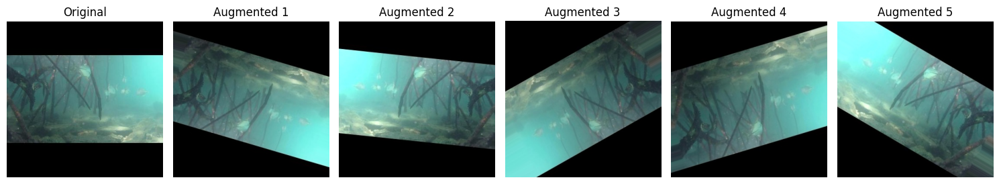

<Figure size 640x480 with 0 Axes>

In [17]:
#7.b. Plot fo tensowflow images

import matplotlib.pyplot as plt
import cv2
import os

%matplotlib inline

# Paths to the original and augmented images
original_img_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'
augmented_img_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/augmented_tensorflow_training_images'

# Specify the filename of the original image
filename = '7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14.jpg'  # Change this to one of your actual image filenames

# Load the original image
original_image_path = os.path.join(original_img_dir, filename)
original_image = cv2.cvtColor(cv2.imread(original_image_path), cv2.COLOR_BGR2RGB)

# Load a few augmented images
augmented_images = []
for i in range(5):  # Display 5 augmented examples
    augmented_image_path = os.path.join(augmented_img_dir, f'augmented_{filename[:-4]}_{i}.jpg')
    augmented_image = cv2.cvtColor(cv2.imread(augmented_image_path), cv2.COLOR_BGR2RGB)
    augmented_images.append(augmented_image)

# Plotting the original and augmented images in a grid
fig, axes = plt.subplots(1, 6, figsize=(15, 5))

# Show the original image in the first column
axes[0].imshow(original_image)
axes[0].set_title("Original")
axes[0].axis('off')

# Show the augmented images in the next columns
for idx, aug_img in enumerate(augmented_images):
    axes[idx + 1].imshow(aug_img)
    axes[idx + 1].set_title(f"Augmented {idx+1}")
    axes[idx + 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()
plt.savefig('augmented_images_comparison.png')  # Save the figure as an image


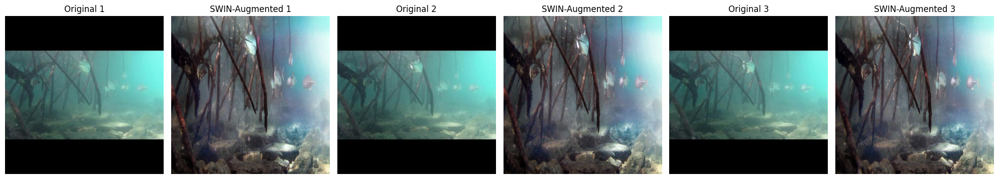

In [26]:
#7.c. Plot for SWIN images:
import matplotlib.pyplot as plt
import cv2
import os

# Paths to the original and augmented images
original_img_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'
augmented_img_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/train/images'

# List of filenames for the two images (original images are .jpg files)
original_filenames = [
    '7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14.jpg',
    '7117_Caranx_sexfasciatus_juvenile_f000001_jpg.rf.0fa1fb7ce55b3edb3b919808392d352d.jpg',
    '7117_Caranx_sexfasciatus_juvenile_f000002_jpg.rf.2f332423ed6043b39183560da27120ac.jpg'
]

# Corresponding augmented filenames (assuming the augmented images are in .png format)
augmented_filenames = [
    '7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14.png',
    '7117_Caranx_sexfasciatus_juvenile_f000001_jpg.rf.0fa1fb7ce55b3edb3b919808392d352d.png',
    '7117_Caranx_sexfasciatus_juvenile_f000002_jpg.rf.2f332423ed6043b39183560da27120ac.png'
]

# Initialize the plot with 1 row and 4 columns
fig, axes = plt.subplots(1, 6, figsize=(20, 5))

# Loop through each image pair (original and augmented)
for idx, (original_filename, augmented_filename) in enumerate(zip(original_filenames, augmented_filenames)):
    # Load the original image (.jpg format)
    original_image_path = os.path.join(original_img_dir, original_filename)
    original_image = cv2.cvtColor(cv2.imread(original_image_path), cv2.COLOR_BGR2RGB)
    
    # Load the corresponding SWIN-augmented image (.png format)
    augmented_image_path = os.path.join(augmented_img_dir, augmented_filename)
    augmented_image = cv2.cvtColor(cv2.imread(augmented_image_path), cv2.COLOR_BGR2RGB)
    
    # Show the original image in the (2 * idx)th column
    axes[2 * idx].imshow(original_image)
    axes[2 * idx].set_title(f"Original {idx+1}")
    axes[2 * idx].axis('off')

    # Show the SWIN-augmented image in the (2 * idx + 1)th column
    axes[2 * idx + 1].imshow(augmented_image)
    axes[2 * idx + 1].set_title(f"SWIN-Augmented {idx+1}")
    axes[2 * idx + 1].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()



In [19]:
#8. SWIN

import os
import cv2
import torch
import torchvision.transforms as transforms
from PIL import Image


import timm

# Define a function to process images with SWIN Transformer and save them
def process_and_save_image(image_path, output_path):
    # Load the pre-trained SWIN Transformer model
    model = timm.create_model('swin_base_patch4_window7_224', pretrained=True)
    model.eval()  # Set to evaluation mode

    # Define image transformations
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    image_tensor = preprocess(image).unsqueeze(0)  # Add batch dimension

    # Get features from the model
    with torch.no_grad():
        features = model(image_tensor)  # Extract features
    
    # Convert the processed image back to PIL format for saving
    processed_image = transforms.ToPILImage()(image_tensor.squeeze(0))  # Remove batch dimension
    
    # Save the processed image
    processed_image.save(output_path)

# Define directories
input_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'
output_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images'

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Process all images in the input directory
for filename in os.listdir(input_dir):
    if filename.endswith('.jpg'):
        image_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, f'processed_{filename}')

        # Process and save image
        process_and_save_image(image_path, output_path)
        print(f'Saved processed image: {output_path}')


C:\Users\Lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Saved processed image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images\processed_7117_Caranx_sexfasciatus_juvenile_f000000_jpg.rf.4d67296de04ef75f519c841c5ae90c14.jpg
Saved processed image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images\processed_7117_Caranx_sexfasciatus_juvenile_f000001_jpg.rf.0fa1fb7ce55b3edb3b919808392d352d.jpg
Saved processed image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images\processed_7117_Caranx_sexfasciatus_juvenile_f000002_jpg.rf.2f332423ed6043b39183560da27120ac.jpg
Saved processed image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images\processed_7117_Caranx_sexfasciatus_juvenile_f000003_jpg.rf.12fba1172037f72cdb6e6bedb942daa5.jpg
Saved processed image: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processe

KeyboardInterrupt: 

In [ ]:
#9.a. Counting fish in frames

import os
from ultralytics import YOLO  

# Load the trained YOLOv8 model using the saved weights from training
model = YOLO('trained_model.pt')

# Path to the directory containing test images
test_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/test/images'

# Initialize a counter for total fish detected
total_fish_count = 0

# Loop through each image in the test directory
for filename in os.listdir(test_images_dir):
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):  # Filter for image formats
        # Get full path to the image
        image_path = os.path.join(test_images_dir, filename)
        
        # Make predictions on the image
        results = model.predict(source=image_path, save=True, save_txt=True)  # Save predictions and labels
        
        # Count the number of fish in the image based on predictions
        fish_count_in_image = 0
        for result in results:
            # The result contains boxes (xyxy), confidences, and class predictions
            detections = result.boxes.xyxy  # Bounding boxes in xyxy format
            class_ids = result.boxes.cls     # Class predictions
            confidences = result.boxes.conf  # Confidences for each prediction
            
            # Assuming class 0 is "fish", you can adapt this based on your model's class order
            fish_detections = [det for det, cls in zip(detections, class_ids) if cls == 0]  # Class 0 is "fish"
            
            fish_count_in_image = len(fish_detections)
            total_fish_count += fish_count_in_image  # Add the fish count to the total
            
            print(f"Detected {fish_count_in_image} fish in {filename}")
        
        # Visualize the predictions (bounding boxes, class labels)
        #result.show()  # This will display the image with bounding boxes and class labels
        
        print(f"Processed {filename}")

# After processing all images, display the total fish count
print(f"Total fish detected across all images: {total_fish_count}")


In [30]:
#9.b. Counting total amount of fish in videos

# Assuming necessary imports are already done
from ultralytics import YOLO
import os

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Path to the video file
video_path = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/videos/videos/'

# Initialize a set to track unique fish IDs
unique_fish_ids = set()
total_fish_count = 0

# Run tracking on the video
results = model.track(source=video_path, save=True, save_txt=True, tracker='bytetrack.yaml')

# Process the tracking results
for result in results:
    detections = result.boxes.xyxy  # Get the bounding boxes in xyxy format
    ids = result.boxes.id if result.boxes.id is not None else []  # Get the IDs assigned by the tracker, ensure it's a list
    
    # Check if any detections were made in the current frame
    if detections is not None and len(detections) > 0:
        for i in range(len(detections)):
            # Assuming class 0 is "fish", adjust if necessary
            if ids and ids[i] not in unique_fish_ids:  # Ensure ids is not None and check if the fish ID is already counted
                unique_fish_ids.add(ids[i])  # Add to the set of unique fish IDs
                total_fish_count += 1  # Increment the total count

# Print the total fish count
print(f'Total unique fish count: {total_fish_count}')



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs
video 1/19 (frame 1/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117.mp4: 384x640 (no detections), 49.2ms
video 1/19 (frame 2/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117.mp4: 384x640 (no detections), 37.2ms
video 1/19 (frame 3/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117

KeyboardInterrupt: 

In [32]:
#9.c Counting fish in each video

# Assuming necessary imports are already done
from ultralytics import YOLO
import os

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Path to the videos directory
video_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/videos/videos/'

# Dictionary to store results
video_fish_counts = {}

# Loop through each video file in the directory
for video_file in os.listdir(video_dir):
    if video_file.endswith('.mp4'):  # Adjust based on your video format
        video_path = os.path.join(video_dir, video_file)

        # Initialize a set to track unique fish IDs for the current video
        unique_fish_ids = set()
        total_fish_count = 0

        # Run tracking on the current video
        results = model.track(source=video_path, save=True, save_txt=True, tracker='bytetrack.yaml')

        # Process the tracking results
        for result in results:
            detections = result.boxes.xyxy  # Get the bounding boxes in xyxy format
            ids = result.boxes.id if result.boxes.id is not None else []  # Get the IDs assigned by the tracker
            
            # Check if any detections were made in the current frame
            if detections is not None and len(detections) > 0:
                for i in range(len(detections)):
                    # Assuming class 0 is "fish", adjust if necessary
                    if ids and ids[i] not in unique_fish_ids:  # Ensure ids is not None and check if the fish ID is already counted
                        unique_fish_ids.add(ids[i])  # Add to the set of unique fish IDs
                        total_fish_count += 1  # Increment the total count

        # Save the total fish count for the current video
        video_fish_counts[video_file] = total_fish_count

# Print the results for each video
print("Fish counts for each video:")
for video, count in video_fish_counts.items():
    print(f'Video: {video}, Total unique fish count: {count}')





WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117.mp4: 384x640 (no detections), 40.1ms
video 1/1 (frame 2/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117.mp4: 384x640 (no detections), 36.6ms
video 1/1 (frame 3/211) C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\videos\videos\7117.

In [71]:
#10.a. Training OG SWIN roboflow. Not suitable, bad intermediary scores for metrics

#Modify your data.yaml file: train: ../processed_images_SWAN_original

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model. Larger models like yolov8m.pt or yolov8l.pt can be used.

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml',  # Path to the data.yaml
    epochs=100,  # You can modify the number of epochs as needed
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('trained_SWAN_model.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.7 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\processed_images_SWAN_original... 0 images, 4568 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:00<00:00, 5380.36it/s]

train: WARNING  No labels found in C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\processed_images_SWAN_original.cache. See https://docs.ultralytics.com/datasets for dataset formatting guidance.


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\processed_images_SWAN_original.cache
WARNING  No labels found in C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\processed_images_SWAN_original.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels.cache... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:00<?, ?it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed
Plotting labels to runs\detect\train6\labels.jpg... 
zero-size array to reduction operation maximum which has no identity
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G          0      21.44          0          0        384:   4%|▍         | 24/571 [00:20<07:45,  1.17it/s]


KeyboardInterrupt: 

In [68]:
#11. SWAN: URSCT-SESR: Reinforced Swin-Convs Transformer for Simultaneous Underwater Sensing Scene Image Enhancement and Super-resolution

import os
import shutil
import subprocess
import natsort

# Define input and output directories for training and validation
train_input_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'
valid_input_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/valid/images'

# Output directories for processed images
train_output_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images/train'
valid_output_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images/valid'

# Create output directories if they don't exist
os.makedirs(train_output_dir, exist_ok=True)
os.makedirs(valid_output_dir, exist_ok=True)

# URSCT-SESR paths
ursct_repo_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/New_SWAN/URSCT-SESR-main'  # Set this to the path where URSCT-SESR is cloned
train_script = os.path.join(ursct_repo_dir, 'scripts', 'Enh_train.py')  # Path to the training script
eval_script = os.path.join(ursct_repo_dir, 'scripts', 'Enh_eval.py')   # Path to the evaluation script
config_file = os.path.join(ursct_repo_dir, 'configs', 'Enh_opt.yaml')  # Path to the configuration file for enhancement

# Function to copy images into the expected URSCT-SESR folder structure
def prepare_ursct_dataset(input_dir, output_dir, dataset_type='train'):
    """ Prepare URSCT-SESR directory structure and copy images into it """
    
    # Define URSCT-SESR dataset structure
    ursct_dataset_dir = os.path.join(ursct_repo_dir, 'dataset', f'{dataset_type}_data')
    input_subdir = os.path.join(ursct_dataset_dir, 'input')
    
    # Create necessary subdirectories
    os.makedirs(input_subdir, exist_ok=True)

    # Copy images into the input folder
    for filename in os.listdir(input_dir):
        if filename.endswith('.jpg'):
            src = os.path.join(input_dir, filename)
            dst = os.path.join(input_subdir, filename)
            shutil.copyfile(src, dst)
    
    print(f'{dataset_type.capitalize()} data prepared at {ursct_dataset_dir}')
    return ursct_dataset_dir

# Prepare training and validation datasets
train_dataset_dir = prepare_ursct_dataset(train_input_dir, train_output_dir, dataset_type='train')
valid_dataset_dir = prepare_ursct_dataset(valid_input_dir, valid_output_dir, dataset_type='valid')

# Function to run URSCT-SESR enhancement on a dataset
def run_ursct_sesr(dataset_dir, output_dir):
    """ Run the URSCT-SESR model on the given dataset """
    
    # Prepare the arguments for the evaluation script
    eval_command = [
        'python', eval_script,
        '--mode', 'eval'  # or 'infer' based on what you're doing
    ]
    
    # Run the evaluation script for URSCT-SESR
    subprocess.run(eval_command)
    print(f'Processed images saved in: {output_dir}')


# Process training and validation datasets
run_ursct_sesr(train_dataset_dir, train_output_dir)
run_ursct_sesr(valid_dataset_dir, valid_output_dir)


Train data prepared at C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/New_SWAN/URSCT-SESR-main\dataset\train_data
Valid data prepared at C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/New_SWAN/URSCT-SESR-main\dataset\valid_data
Processed images saved in: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images/train
Processed images saved in: C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/processed_images/valid


In [73]:
#12 .a. Create a 5k sample containing both original train images and TensorFlow Keras modified images

import os
import random
import shutil

# Define directories
original_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/train/images'
augmented_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/augmented_tensorflow_training_images'
merged_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/merged_images'  # Directory to merge images
sampled_images_dir = 'C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/sample_images'  # Directory to save sampled images

# Create directories for merged and sampled images if they don't exist
os.makedirs(merged_images_dir, exist_ok=True)
os.makedirs(sampled_images_dir, exist_ok=True)

# Merge original and augmented images into a single folder
for image in os.listdir(original_images_dir):
    shutil.copy(os.path.join(original_images_dir, image), merged_images_dir)

for image in os.listdir(augmented_images_dir):
    shutil.copy(os.path.join(augmented_images_dir, image), merged_images_dir)

# List all images in the merged directory
#merged_images = os.listdir(merged_images_dir)

# Randomly sample 5000 images
sampled_images = random.sample(merged_images, min(5000, len(merged_images)))

# Copy sampled images to the new directory
for image in sampled_images:
    shutil.copy(os.path.join(merged_images_dir, image), sampled_images_dir)

print(f'Sampled {len(sampled_images)} images from the merged directory.')


NameError: name 'merged_images' is not defined

In [75]:
# List all images in the merged directory
merged_images = os.listdir(merged_images_dir)

# Randomly sample 5000 images
sampled_images = random.sample(merged_images, min(5000, len(merged_images)))

# Copy sampled images to the new directory
for image in sampled_images:
    shutil.copy(os.path.join(merged_images_dir, image), sampled_images_dir)

print(f'Sampled {len(sampled_images)} images from the merged directory.')


Sampled 5000 images from the merged directory.


In [ ]:
#12 .b. Training on 5k sample containing both original train images and TensorFlow Keras modified images
#NOT DONE YET


#Modify your data.yaml file: train: ../Augmented_tensor_flow/sample_images

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml',  # Path to the data.yaml
    epochs=100,  # You can modify the number of epochs as needed
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('tensorflow_trained_model.pt')  # Save the model after training

In [8]:
#13. Training on blue-filtered original data
# DONE

#Modify your data.yaml file: train: ../Blue_filtered_OG

# Load the YOLOv8 model
model = YOLO('trained_model.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Blue_filtered/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('50epochs_bluefiltered_YOLOv8n.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.13 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=trained_model.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Blue_filtered/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augm

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:07<00:00, 584.08it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:03<00:00, 403.49it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed


val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\valid\labels.cache
Plotting labels to runs\detect\train12\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train12
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G       1.32      0.672     0.9456         27        384: 100%|██████████| 571/571 [05:15<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.25it/s]

                   all       1304       3033      0.903      0.789      0.865      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.384     0.7263     0.9656         29        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033      0.894      0.776      0.864      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.443     0.7723     0.9861          8        384: 100%|██████████| 571/571 [03:53<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033      0.891      0.763      0.849      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.445     0.7902      0.986          9        384: 100%|██████████| 571/571 [03:58<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.13it/s]

                   all       1304       3033      0.882      0.776      0.856      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G       1.47     0.7917     0.9902         21        384: 100%|██████████| 571/571 [03:58<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.20it/s]

                   all       1304       3033       0.88      0.772      0.848      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G       1.47     0.7832     0.9892         23        384: 100%|██████████| 571/571 [05:05<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.882      0.765      0.848      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.466     0.7984     0.9907         22        384: 100%|██████████| 571/571 [05:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.871      0.766      0.844      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.437     0.7815     0.9826         30        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.863      0.771      0.847      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.448     0.7696     0.9842         32        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.866      0.775      0.849      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.451     0.7777     0.9847         29        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.884      0.744      0.838      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.421     0.7598     0.9769         21        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.866      0.757      0.845      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.413     0.7524     0.9745         16        384: 100%|██████████| 571/571 [05:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.23it/s]

                   all       1304       3033      0.871      0.776      0.858      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.424     0.7539     0.9775         32        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033       0.88      0.773      0.857      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.424     0.7496     0.9808         29        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.874       0.79      0.861       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.407     0.7453     0.9712         24        384: 100%|██████████| 571/571 [05:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.881      0.785      0.864      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.413     0.7374     0.9689         13        384: 100%|██████████| 571/571 [05:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.886      0.784      0.859      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.383     0.7187     0.9686         22        384: 100%|██████████| 571/571 [05:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033        0.9       0.78      0.864      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      1.366     0.7107     0.9636         21        384: 100%|██████████| 571/571 [05:12<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.28it/s]

                   all       1304       3033      0.886      0.781      0.867      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      1.394     0.7272     0.9701         19        384: 100%|██████████| 571/571 [04:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033       0.89       0.75      0.844      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      1.367     0.7167     0.9598         34        384: 100%|██████████| 571/571 [03:55<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033      0.893      0.779      0.863      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G       1.38     0.7153     0.9616         22        384: 100%|██████████| 571/571 [03:54<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.16it/s]

                   all       1304       3033      0.899      0.774      0.865      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      1.369     0.7049     0.9631         31        384: 100%|██████████| 571/571 [03:51<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.22it/s]

                   all       1304       3033      0.902      0.792      0.873      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.352     0.6976     0.9585         32        384: 100%|██████████| 571/571 [03:58<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]

                   all       1304       3033      0.899       0.78      0.864      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      1.349     0.6934     0.9572         37        384: 100%|██████████| 571/571 [03:57<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]

                   all       1304       3033        0.9      0.792       0.87      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.346     0.6893     0.9544         34        384: 100%|██████████| 571/571 [03:55<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.13it/s]

                   all       1304       3033      0.895      0.796      0.866      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.348     0.6848     0.9575         23        384: 100%|██████████| 571/571 [03:54<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]

                   all       1304       3033      0.899      0.798      0.872      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.357     0.6903     0.9567         37        384: 100%|██████████| 571/571 [03:46<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.14it/s]

                   all       1304       3033      0.899      0.796      0.873      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.331     0.6767     0.9495         17        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.15it/s]

                   all       1304       3033      0.901      0.787      0.867      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      1.317     0.6685     0.9511          6        384: 100%|██████████| 571/571 [03:58<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.15it/s]

                   all       1304       3033      0.891      0.807      0.879      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      1.307     0.6656     0.9431         21        384: 100%|██████████| 571/571 [03:56<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.911      0.798      0.876      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.318     0.6574      0.948         35        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.16it/s]

                   all       1304       3033      0.895      0.803       0.88      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      1.312     0.6624     0.9451         41        384: 100%|██████████| 571/571 [03:54<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.14it/s]

                   all       1304       3033      0.913      0.804      0.883      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      1.296      0.653     0.9439         21        384: 100%|██████████| 571/571 [03:53<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.16it/s]


                   all       1304       3033       0.91      0.811      0.885      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G       1.29     0.6491     0.9415         26        384: 100%|██████████| 571/571 [03:52<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.14it/s]

                   all       1304       3033      0.899      0.817      0.885      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      1.286     0.6469      0.939         31        384: 100%|██████████| 571/571 [03:58<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]

                   all       1304       3033      0.901      0.813      0.888      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      1.255     0.6376     0.9355         12        384: 100%|██████████| 571/571 [03:56<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033      0.913      0.814      0.891       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      1.272     0.6335      0.936         30        384: 100%|██████████| 571/571 [03:55<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033      0.905      0.814      0.889      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      1.276     0.6356     0.9386         34        384: 100%|██████████| 571/571 [03:45<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.16it/s]

                   all       1304       3033       0.91      0.812      0.887      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G       1.27     0.6291     0.9313         13        384: 100%|██████████| 571/571 [03:53<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.14it/s]

                   all       1304       3033      0.912      0.813      0.889      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      1.257      0.623     0.9283         23        384: 100%|██████████| 571/571 [03:53<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.11it/s]

                   all       1304       3033       0.91      0.818      0.892      0.513


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G      1.249     0.5989     0.9277         13        384: 100%|██████████| 571/571 [03:55<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.13it/s]

                   all       1304       3033      0.904       0.82       0.89      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      1.236     0.5896     0.9272         23        384: 100%|██████████| 571/571 [03:53<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.14it/s]

                   all       1304       3033      0.916      0.813      0.891      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G      1.232     0.5798     0.9249         36        384: 100%|██████████| 571/571 [03:52<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.12it/s]

                   all       1304       3033      0.915      0.818      0.896       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G      1.221     0.5786     0.9231         22        384: 100%|██████████| 571/571 [03:54<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.12it/s]

                   all       1304       3033      0.912      0.821      0.895      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      1.212     0.5705     0.9202         10        384: 100%|██████████| 571/571 [03:50<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.06it/s]

                   all       1304       3033      0.912      0.821      0.894       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      1.203     0.5637      0.918         20        384: 100%|██████████| 571/571 [03:51<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.10it/s]

                   all       1304       3033      0.915      0.824      0.899      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G      1.195     0.5618      0.916         19        384: 100%|██████████| 571/571 [03:57<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]

                   all       1304       3033      0.909      0.832        0.9      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G      1.177     0.5525     0.9114         24        384: 100%|██████████| 571/571 [03:56<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.26it/s]


                   all       1304       3033      0.917      0.825      0.899      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      1.188     0.5544     0.9101         22        384: 100%|██████████| 571/571 [05:06<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.21it/s]

                   all       1304       3033      0.918      0.824        0.9      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      1.179     0.5584     0.9121         24        384: 100%|██████████| 571/571 [05:10<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:29<00:00,  2.81it/s]

                   all       1304       3033       0.92      0.825      0.902      0.529



50 epochs completed in 4.008 hours.
Optimizer stripped from runs\detect\train12\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train12\weights\best.pt, 6.2MB

Validating runs\detect\train12\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.11it/s]


                   all       1304       3033       0.92      0.825      0.902      0.529
Speed: 0.2ms preprocess, 17.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train12


In [3]:
#13. Training on SWIN data
# DONE

#Modify your data.yaml file: train: ../Blue_filtered_OG
from ultralytics import YOLO
# Load the YOLOv8 model
model = YOLO('trained_model.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml',  # Path to the data.yaml
    epochs=100,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('SWIN_YOLOv8n_model.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.9 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=trained_model.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False,

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:08<00:00, 558.85it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:02<00:00, 552.70it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed
val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels.cache


Plotting labels to runs\detect\train7\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train7
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      3.043      2.707      1.601         27        384: 100%|██████████| 571/571 [04:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.258      0.248      0.156      0.041



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      2.506      2.029      1.303         29        384: 100%|██████████| 571/571 [04:40<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.41it/s]

                   all       1304       3033      0.132      0.126     0.0651     0.0161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      2.413      1.872      1.275          8        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.191      0.116     0.0885     0.0237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      2.302      1.735      1.237          9        384: 100%|██████████| 571/571 [04:46<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.42it/s]

                   all       1304       3033      0.102     0.0623     0.0412    0.00968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      2.225      1.628      1.208         21        384: 100%|██████████| 571/571 [04:49<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.42it/s]

                   all       1304       3033       0.25      0.101     0.0887     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      2.178      1.534       1.19         23        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.43it/s]

                   all       1304       3033       0.22      0.093     0.0784     0.0167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      2.121      1.487      1.173         22        384: 100%|██████████| 571/571 [04:47<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.121     0.0933     0.0618     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      2.078      1.425      1.149         30        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.108     0.0956     0.0578     0.0114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      2.049      1.364      1.139         32        384: 100%|██████████| 571/571 [04:56<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033       0.19     0.0748     0.0621      0.014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      2.026      1.353      1.136         29        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]


                   all       1304       3033      0.118     0.0752     0.0449    0.00951

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G          2      1.296       1.12         21        384: 100%|██████████| 571/571 [04:50<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.37it/s]

                   all       1304       3033      0.161     0.0607     0.0466     0.0103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.952      1.263      1.112         16        384: 100%|██████████| 571/571 [04:47<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.44it/s]

                   all       1304       3033       0.32       0.06     0.0593     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.978      1.284      1.111         32        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]

                   all       1304       3033       0.18      0.061     0.0498     0.0113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.928      1.228        1.1         29        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.41it/s]


                   all       1304       3033      0.213      0.058     0.0444    0.00897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.927      1.228      1.097         24        384: 100%|██████████| 571/571 [04:58<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.266     0.0695     0.0627     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.902      1.187      1.083         13        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]

                   all       1304       3033      0.159     0.0643     0.0542     0.0118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.881      1.179      1.086         22        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.41it/s]

                   all       1304       3033      0.242      0.065     0.0546     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      1.841      1.146      1.075         21        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]

                   all       1304       3033      0.227     0.0501      0.045     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.867      1.175      1.084         19        384: 100%|██████████| 571/571 [04:44<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.147     0.0633     0.0492     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      1.854      1.157      1.071         34        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.105     0.0804      0.059     0.0134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      1.826      1.124      1.062         22        384: 100%|██████████| 571/571 [04:50<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.165      0.061     0.0509     0.0109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.817      1.121      1.066         31        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.37it/s]

                   all       1304       3033      0.292     0.0587     0.0559     0.0121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G        1.8      1.088      1.062         32        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.186     0.0626     0.0465     0.0089



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      1.803       1.08      1.058         37        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.151     0.0676     0.0453    0.00989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      1.781      1.063      1.052         34        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.41it/s]

                   all       1304       3033      0.135     0.0617     0.0448     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.772       1.06      1.048         23        384: 100%|██████████| 571/571 [04:47<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.121     0.0857      0.053     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G       1.78      1.055      1.048         37        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.175     0.0643     0.0564     0.0128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.761      1.043      1.042         17        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]


                   all       1304       3033      0.193     0.0584     0.0524     0.0109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G       1.73      1.024       1.04          6        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.201     0.0544     0.0506     0.0113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.727       1.01      1.035         21        384: 100%|██████████| 571/571 [04:50<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]


                   all       1304       3033     0.0782     0.0564     0.0338    0.00737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      1.732      1.012      1.035         35        384: 100%|██████████| 571/571 [04:47<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.206     0.0725      0.057     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G       1.72      1.006      1.033         41        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033       0.17     0.0593     0.0475     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      1.706     0.9983      1.035         21        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.166     0.0607     0.0477    0.00983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G       1.71     0.9892      1.033         26        384: 100%|██████████| 571/571 [04:47<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.203      0.065     0.0588     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      1.687     0.9814      1.022         31        384: 100%|██████████| 571/571 [04:50<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.202     0.0561     0.0398    0.00695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      1.658     0.9672      1.022         12        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]

                   all       1304       3033      0.117     0.0633     0.0409     0.0086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      1.658     0.9598      1.018         30        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.191     0.0541     0.0434    0.00891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      1.657     0.9502      1.017         34        384: 100%|██████████| 571/571 [04:45<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.182     0.0561     0.0417    0.00874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      1.654     0.9546      1.011         13        384: 100%|██████████| 571/571 [04:58<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.178     0.0593     0.0473     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      1.645     0.9411      1.007         23        384: 100%|██████████| 571/571 [05:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:29<00:00,  2.77it/s]

                   all       1304       3033      0.231      0.062     0.0535     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      1.642     0.9417       1.01         36        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]

                   all       1304       3033      0.211     0.0617     0.0458    0.00915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G      1.629     0.9289      1.011         25        384: 100%|██████████| 571/571 [04:47<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.37it/s]

                   all       1304       3033      0.159      0.064      0.047     0.0103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      1.635     0.9309      1.003         37        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.55it/s]


                   all       1304       3033      0.144     0.0626     0.0458     0.0108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      1.601      0.913      1.004         27        384: 100%|██████████| 571/571 [04:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.145     0.0706     0.0525     0.0109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      1.621     0.9198      1.011         38        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.41it/s]

                   all       1304       3033      0.252      0.062      0.057     0.0117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      1.592     0.8901     0.9993         31        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.37it/s]

                   all       1304       3033      0.246     0.0679     0.0603     0.0127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G      1.605     0.9025     0.9982         39        384: 100%|██████████| 571/571 [04:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.178     0.0481     0.0312    0.00668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      1.603     0.9099      1.006         24        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.49it/s]


                   all       1304       3033       0.24     0.0656     0.0579     0.0128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      1.599     0.9022      1.005         23        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.186     0.0659     0.0512     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G      1.566      0.872     0.9947         32        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.179     0.0666     0.0523     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G      1.569       0.87     0.9926         34        384: 100%|██████████| 571/571 [04:50<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]


                   all       1304       3033      0.188     0.0712     0.0522     0.0109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      1.556     0.8758     0.9885          6        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.183     0.0617      0.044    0.00972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G      1.548     0.8612     0.9866         22        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.37it/s]

                   all       1304       3033      0.127     0.0682     0.0473    0.00955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G      1.569     0.8723     0.9889         38        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.28it/s]

                   all       1304       3033      0.284      0.059      0.064     0.0147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G      1.574     0.8736     0.9863         37        384: 100%|██████████| 571/571 [04:46<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]


                   all       1304       3033      0.136     0.0633     0.0396    0.00817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G      1.521     0.8465     0.9845         13        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.44it/s]

                   all       1304       3033      0.166      0.058     0.0446    0.00992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      1.552     0.8604      0.988         30        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]


                   all       1304       3033      0.172     0.0732     0.0622     0.0149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G      1.539      0.856      0.982         32        384: 100%|██████████| 571/571 [04:47<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.232     0.0682     0.0568     0.0119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      1.514     0.8286     0.9784         39        384: 100%|██████████| 571/571 [04:49<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]

                   all       1304       3033      0.239     0.0603     0.0465    0.00928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G      1.529     0.8414     0.9846         43        384: 100%|██████████| 571/571 [04:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.216     0.0623     0.0517      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G       1.52     0.8338     0.9771         30        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.40it/s]

                   all       1304       3033       0.22      0.062     0.0478    0.00963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G      1.492     0.8134     0.9757         20        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]


                   all       1304       3033      0.263     0.0584     0.0497     0.0108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G      1.511     0.8257     0.9765          9        384: 100%|██████████| 571/571 [04:53<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]


                   all       1304       3033       0.19     0.0676     0.0467    0.00938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G       1.51     0.8272     0.9745         48        384: 100%|██████████| 571/571 [04:49<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.222     0.0699     0.0506     0.0109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G       1.49     0.8123      0.972         19        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]

                   all       1304       3033      0.199     0.0659     0.0544      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G      1.484     0.8096     0.9717         14        384: 100%|██████████| 571/571 [04:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.214      0.063     0.0526     0.0115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G      1.485     0.8006     0.9647         33        384: 100%|██████████| 571/571 [04:50<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.182      0.062      0.051     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G      1.491     0.8142     0.9697         46        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.43it/s]

                   all       1304       3033      0.202     0.0758     0.0654     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G      1.466     0.7968     0.9678         24        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]


                   all       1304       3033      0.297     0.0643     0.0633     0.0137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G      1.459     0.7948     0.9667         28        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.45it/s]

                   all       1304       3033      0.243     0.0567     0.0517      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G      1.458     0.8006      0.969         34        384: 100%|██████████| 571/571 [04:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.36it/s]

                   all       1304       3033      0.217     0.0659     0.0549     0.0117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G      1.459     0.7949     0.9686         11        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.231      0.058     0.0493     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G      1.441     0.7832     0.9639         61        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:23<00:00,  3.45it/s]

                   all       1304       3033       0.24     0.0636     0.0585     0.0133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G      1.463     0.7834     0.9607         10        384: 100%|██████████| 571/571 [04:53<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.207      0.061     0.0534     0.0121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G      1.445     0.7788      0.963         15        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.328      0.062     0.0592      0.013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G      1.424     0.7777     0.9534         14        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]

                   all       1304       3033      0.241     0.0666     0.0605     0.0132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G      1.429      0.772     0.9535         28        384: 100%|██████████| 571/571 [04:49<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.235      0.058     0.0559     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G      1.412     0.7638     0.9546         38        384: 100%|██████████| 571/571 [04:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]


                   all       1304       3033       0.23     0.0613      0.057     0.0127

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G       1.42     0.7662      0.955         47        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]


                   all       1304       3033       0.17     0.0607     0.0553      0.013

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G      1.424     0.7691     0.9592         38        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.30it/s]

                   all       1304       3033      0.243     0.0607     0.0561      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G      1.404     0.7612     0.9577         30        384: 100%|██████████| 571/571 [05:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.256     0.0636      0.057     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G       1.41     0.7566      0.956         29        384: 100%|██████████| 571/571 [05:33<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.239     0.0617     0.0527     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G        1.4     0.7543     0.9466         24        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.25it/s]

                   all       1304       3033      0.233     0.0646     0.0555     0.0117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G       1.41     0.7569     0.9518         13        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.25it/s]

                   all       1304       3033      0.208     0.0676     0.0585     0.0122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G      1.392     0.7492     0.9508         20        384: 100%|██████████| 571/571 [05:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.28it/s]

                   all       1304       3033      0.187     0.0706     0.0593      0.013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      1.388     0.7468     0.9471         33        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]

                   all       1304       3033       0.19     0.0686     0.0583     0.0121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G      1.364     0.7297     0.9435         26        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.20it/s]

                   all       1304       3033      0.175     0.0682      0.057     0.0126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G      1.376     0.7361     0.9458         38        384: 100%|██████████| 571/571 [05:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.28it/s]

                   all       1304       3033      0.202     0.0692     0.0576      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G       1.36     0.7283     0.9459         35        384: 100%|██████████| 571/571 [04:56<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]

                   all       1304       3033      0.201     0.0692     0.0561     0.0119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G      1.366     0.7266     0.9423         21        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.32it/s]

                   all       1304       3033      0.195     0.0663     0.0516     0.0104


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G       1.33      0.693     0.9397         17        384: 100%|██████████| 571/571 [04:56<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]

                   all       1304       3033      0.194     0.0686     0.0496    0.00946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G      1.314     0.6706     0.9336         20        384: 100%|██████████| 571/571 [04:53<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.25it/s]

                   all       1304       3033      0.189     0.0692     0.0507    0.00956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G       1.31     0.6688     0.9298         20        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.22it/s]


                   all       1304       3033       0.18     0.0653     0.0495    0.00943

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      1.297     0.6665     0.9338         22        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.34it/s]

                   all       1304       3033      0.175     0.0656     0.0502    0.00922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G      1.293      0.658     0.9287          5        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]


                   all       1304       3033      0.187     0.0689      0.054     0.0104

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G      1.272     0.6512     0.9252         23        384: 100%|██████████| 571/571 [05:00<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.57it/s]

                   all       1304       3033      0.165     0.0673     0.0511    0.00995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G      1.269     0.6475     0.9252         32        384: 100%|██████████| 571/571 [05:09<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.182     0.0669     0.0518    0.00989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G      1.265     0.6476     0.9222         26        384: 100%|██████████| 571/571 [05:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.19it/s]

                   all       1304       3033      0.169     0.0676     0.0518    0.00978



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G      1.252     0.6406     0.9191          8        384: 100%|██████████| 571/571 [04:56<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.26it/s]

                   all       1304       3033      0.184      0.067      0.052    0.00989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G      1.251      0.642     0.9186          4        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033       0.18     0.0676     0.0515       0.01



100 epochs completed in 8.851 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 6.2MB

Validating runs\detect\train7\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:22<00:00,  3.66it/s]


                   all       1304       3033      0.258      0.248      0.156      0.041
Speed: 0.2ms preprocess, 14.8ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train7


In [5]:
#14.a. Re-train original train data, YOLOv8n, 50 epochs
# Train the model
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model. Larger models like yolov8m.pt or yolov8l.pt can be used.

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs as needed
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('50epochs_originaltraindata_YOLOv8n.pt')  # Save the model after training


New https://pypi.org/project/ultralytics/8.3.13 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:06<00:00, 742.70it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:01<00:00, 753.24it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed
val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\valid\labels.cache


Plotting labels to runs\detect\train6\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      2.104      2.177      1.251         27        384: 100%|██████████| 571/571 [04:03<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.86it/s]

                   all       1304       3033      0.608      0.456      0.494       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      2.098      1.657      1.263         29        384: 100%|██████████| 571/571 [04:13<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.88it/s]

                   all       1304       3033      0.691      0.492      0.545      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      2.072      1.565      1.258          8        384: 100%|██████████| 571/571 [04:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.90it/s]

                   all       1304       3033      0.656      0.443      0.482        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      2.011      1.459      1.235          9        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.97it/s]

                   all       1304       3033      0.712      0.559      0.612      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.984      1.377      1.215         21        384: 100%|██████████| 571/571 [04:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.94it/s]

                   all       1304       3033      0.711      0.532      0.585      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.936      1.329      1.189         23        384: 100%|██████████| 571/571 [04:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.91it/s]

                   all       1304       3033      0.775      0.582      0.646      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G        1.9      1.276       1.17         22        384: 100%|██████████| 571/571 [04:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.96it/s]

                   all       1304       3033       0.79      0.601      0.681      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.842      1.213      1.148         30        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.94it/s]

                   all       1304       3033      0.787      0.613       0.68       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.804      1.152      1.132         32        384: 100%|██████████| 571/571 [04:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]

                   all       1304       3033      0.802       0.63      0.704      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.788      1.157      1.125         29        384: 100%|██████████| 571/571 [04:06<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  3.01it/s]

                   all       1304       3033      0.822      0.619      0.717      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.773      1.093      1.108         21        384: 100%|██████████| 571/571 [04:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  3.01it/s]

                   all       1304       3033      0.831      0.641      0.728      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.732      1.065      1.099         16        384: 100%|██████████| 571/571 [04:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]

                   all       1304       3033      0.843      0.617      0.728      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.732      1.052      1.098         32        384: 100%|██████████| 571/571 [04:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]


                   all       1304       3033      0.811       0.67      0.748      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.712      1.034       1.09         29        384: 100%|██████████| 571/571 [04:15<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.803      0.638      0.732      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G       1.69      1.012      1.079         24        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.91it/s]

                   all       1304       3033      0.814      0.664      0.751      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.679     0.9886       1.07         13        384: 100%|██████████| 571/571 [04:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.95it/s]

                   all       1304       3033      0.822      0.674      0.762       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.646     0.9704      1.066         22        384: 100%|██████████| 571/571 [04:12<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.864      0.673      0.775      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G       1.62     0.9509      1.062         21        384: 100%|██████████| 571/571 [04:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.95it/s]

                   all       1304       3033       0.85      0.679      0.777      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      1.628     0.9551      1.061         19        384: 100%|██████████| 571/571 [04:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.94it/s]

                   all       1304       3033      0.868      0.683      0.785      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      1.611     0.9376      1.049         34        384: 100%|██████████| 571/571 [04:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.93it/s]

                   all       1304       3033      0.876      0.698      0.793      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G       1.61     0.9168      1.046         22        384: 100%|██████████| 571/571 [04:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.88it/s]

                   all       1304       3033      0.862        0.7      0.802      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      1.582      0.904      1.042         31        384: 100%|██████████| 571/571 [04:42<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:40<00:00,  2.01it/s]

                   all       1304       3033      0.861      0.702      0.797      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.572      0.884      1.036         32        384: 100%|██████████| 571/571 [04:22<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.91it/s]

                   all       1304       3033       0.87      0.729      0.808      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      1.563     0.8876      1.034         37        384: 100%|██████████| 571/571 [04:12<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.99it/s]

                   all       1304       3033       0.85      0.719      0.806      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.553     0.8662      1.026         34        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.876      0.736       0.82       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.545     0.8547      1.025         23        384: 100%|██████████| 571/571 [04:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.87it/s]

                   all       1304       3033      0.866      0.729      0.822      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.547     0.8613      1.019         37        384: 100%|██████████| 571/571 [04:20<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.95it/s]

                   all       1304       3033      0.867      0.735      0.822      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.528     0.8383      1.016         17        384: 100%|██████████| 571/571 [04:24<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]

                   all       1304       3033      0.867      0.741      0.826      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      1.505     0.8234      1.016          6        384: 100%|██████████| 571/571 [04:18<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  3.00it/s]

                   all       1304       3033      0.877      0.732      0.831      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      1.502     0.8152      1.006         21        384: 100%|██████████| 571/571 [04:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.87it/s]

                   all       1304       3033      0.849      0.728      0.815      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.486     0.8048      1.005         35        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.98it/s]

                   all       1304       3033      0.871      0.759      0.838      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      1.479     0.8034          1         41        384: 100%|██████████| 571/571 [04:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.95it/s]

                   all       1304       3033      0.876      0.759      0.838      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      1.476     0.7952     0.9999         21        384: 100%|██████████| 571/571 [04:19<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.98it/s]

                   all       1304       3033      0.877      0.749      0.839      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G      1.462     0.7903     0.9966         26        384: 100%|██████████| 571/571 [04:13<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.88it/s]

                   all       1304       3033       0.88      0.757      0.842      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      1.461     0.7849     0.9958         31        384: 100%|██████████| 571/571 [04:20<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.96it/s]

                   all       1304       3033      0.881      0.764      0.848      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      1.427     0.7669     0.9881         12        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.86it/s]

                   all       1304       3033      0.876      0.772      0.846      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      1.429     0.7563     0.9867         30        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.98it/s]

                   all       1304       3033      0.882      0.762      0.848      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      1.425     0.7494     0.9844         34        384: 100%|██████████| 571/571 [04:12<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.90it/s]

                   all       1304       3033      0.871      0.761      0.846      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G      1.413     0.7569     0.9773         13        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.889      0.768      0.854      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G       1.41     0.7346     0.9762         23        384: 100%|██████████| 571/571 [04:17<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.91it/s]

                   all       1304       3033      0.884      0.773      0.859       0.48


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G      1.395     0.7074     0.9757         13        384: 100%|██████████| 571/571 [04:15<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]

                   all       1304       3033      0.877      0.783      0.859      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      1.371     0.6863     0.9732         23        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.86it/s]

                   all       1304       3033      0.906      0.763      0.861      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G      1.371     0.6802     0.9685         36        384: 100%|██████████| 571/571 [04:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033       0.89      0.774      0.862      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G      1.347     0.6719     0.9633         22        384: 100%|██████████| 571/571 [04:21<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.96it/s]


                   all       1304       3033      0.897      0.778      0.867      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      1.332     0.6581     0.9576         10        384: 100%|██████████| 571/571 [04:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.91it/s]

                   all       1304       3033        0.9      0.779       0.87      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      1.325     0.6529     0.9547         20        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:27<00:00,  2.93it/s]

                   all       1304       3033      0.897      0.786      0.873      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G      1.307     0.6466     0.9501         19        384: 100%|██████████| 571/571 [04:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.897      0.784      0.874      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G      1.284     0.6346     0.9456         24        384: 100%|██████████| 571/571 [04:13<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.87it/s]

                   all       1304       3033      0.901      0.784      0.874        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      1.301     0.6308      0.945         22        384: 100%|██████████| 571/571 [04:15<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.89it/s]

                   all       1304       3033      0.909      0.787      0.879      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      1.287     0.6358     0.9454         24        384: 100%|██████████| 571/571 [04:11<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.92it/s]

                   all       1304       3033      0.901      0.794      0.879      0.502



50 epochs completed in 3.927 hours.
Optimizer stripped from runs\detect\train6\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train6\weights\best.pt, 6.2MB

Validating runs\detect\train6\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.28it/s]


                   all       1304       3033       0.91      0.786      0.879      0.502
Speed: 0.2ms preprocess, 16.8ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train6


In [4]:
#14.b. Re-train 50 epochs blue-filtered data

#Modify your data.yaml file: train: ../Blue_filtered_OG

# Load the YOLOv8 model
model = YOLO('trained_model.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Blue_filtered/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('50epochs_blue_YOLOv8n.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.13 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=trained_model.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Blue_filtered/data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, aug

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\train\labels.cache... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:00<?, ?it/s]
val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\valid\labels.cache... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:00<?, ?it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Blue_filtered\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed


Plotting labels to runs\detect\train10\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train10
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.216     0.7563     0.9543         30        384:   1%|          | 6/571 [00:02<04:35,  2.05it/s]


KeyboardInterrupt: 

In [6]:
#14.c. Re-train 50 epochs SWIN data

#Modify your data.yaml file: train: ../SWIN/train
from ultralytics import YOLO
# Load the YOLOv8 model
model = YOLO('trained_model.pt')  # 'yolov8n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('50epochs_SWIN_YOLOv8n_model.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.13 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=trained_model.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False,

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:07<00:00, 614.19it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:01<00:00, 755.09it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed


val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels.cache
Plotting labels to runs\detect\train7\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train7
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      3.043      2.707      1.601         27        384: 100%|██████████| 571/571 [07:14<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:30<00:00,  2.69it/s]


                   all       1304       3033      0.258      0.248      0.156      0.041

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      2.509      2.029      1.303         29        384: 100%|██████████| 571/571 [04:56<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.28it/s]

                   all       1304       3033       0.14      0.131     0.0773     0.0198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      2.391      1.869      1.271          8        384: 100%|██████████| 571/571 [04:45<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033      0.158      0.117     0.0775     0.0202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      2.295      1.716      1.234          9        384: 100%|██████████| 571/571 [04:55<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]

                   all       1304       3033      0.184        0.1     0.0716     0.0173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      2.221      1.614      1.211         21        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]

                   all       1304       3033      0.112      0.103     0.0742     0.0176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      2.193      1.546      1.199         23        384: 100%|██████████| 571/571 [05:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]

                   all       1304       3033      0.119     0.0851     0.0618     0.0134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      2.128      1.477       1.17         22        384: 100%|██████████| 571/571 [05:02<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.221      0.058     0.0528     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G       2.06      1.399      1.141         30        384: 100%|██████████| 571/571 [05:04<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.17it/s]

                   all       1304       3033     0.0889     0.0953     0.0494       0.01



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      2.017      1.347      1.129         32        384: 100%|██████████| 571/571 [04:52<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]

                   all       1304       3033      0.178      0.101     0.0787     0.0179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      2.004      1.337      1.126         29        384: 100%|██████████| 571/571 [05:04<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.20it/s]

                   all       1304       3033       0.14     0.0884     0.0639     0.0137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.966      1.269      1.109         21        384: 100%|██████████| 571/571 [05:03<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.33it/s]

                   all       1304       3033       0.18     0.0775      0.053     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.932      1.241      1.106         16        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.28it/s]


                   all       1304       3033      0.239     0.0574     0.0573     0.0105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.954      1.261      1.105         32        384: 100%|██████████| 571/571 [04:56<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.26it/s]


                   all       1304       3033      0.142     0.0709     0.0512     0.0108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.907      1.211      1.097         29        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.39it/s]

                   all       1304       3033      0.106      0.061     0.0309    0.00682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.888      1.201      1.089         24        384: 100%|██████████| 571/571 [04:48<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.31it/s]

                   all       1304       3033      0.178     0.0791     0.0618     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.868      1.161      1.075         13        384: 100%|██████████| 571/571 [04:55<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.26it/s]

                   all       1304       3033      0.196     0.0663     0.0516     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.835      1.131      1.072         22        384: 100%|██████████| 571/571 [04:57<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.25it/s]

                   all       1304       3033       0.18     0.0894     0.0739     0.0164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      1.799      1.114      1.066         21        384: 100%|██████████| 571/571 [04:58<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]

                   all       1304       3033      0.115     0.0841     0.0576     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      1.811      1.117      1.067         19        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.19it/s]

                   all       1304       3033      0.164     0.0795     0.0621     0.0143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      1.794      1.108      1.059         34        384: 100%|██████████| 571/571 [04:50<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.26it/s]

                   all       1304       3033      0.185     0.0729     0.0629     0.0147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      1.791      1.081      1.052         22        384: 100%|██████████| 571/571 [04:59<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.24it/s]


                   all       1304       3033      0.153     0.0748     0.0582     0.0126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G       1.76      1.069      1.054         31        384: 100%|██████████| 571/571 [04:59<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.19it/s]

                   all       1304       3033       0.14     0.0574     0.0415    0.00866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.747      1.049      1.048         32        384: 100%|██████████| 571/571 [04:50<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:24<00:00,  3.29it/s]

                   all       1304       3033      0.181     0.0795     0.0637      0.014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      1.738      1.033      1.042         37        384: 100%|██████████| 571/571 [05:03<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.18it/s]

                   all       1304       3033      0.251     0.0534     0.0452    0.00841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.712       1.01      1.035         34        384: 100%|██████████| 571/571 [04:56<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.20it/s]

                   all       1304       3033      0.185     0.0564     0.0473    0.00938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.707      1.004      1.033         23        384: 100%|██████████| 571/571 [05:05<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:26<00:00,  3.15it/s]

                   all       1304       3033      0.229      0.061     0.0511     0.0101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.713       1.01      1.031         37        384: 100%|██████████| 571/571 [06:21<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.30it/s]

                   all       1304       3033      0.209     0.0788     0.0628     0.0136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.687     0.9846      1.024         17        384: 100%|██████████| 571/571 [06:49<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.31it/s]

                   all       1304       3033      0.128     0.0715     0.0493     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      1.658     0.9545      1.021          6        384: 100%|██████████| 571/571 [06:50<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.31it/s]

                   all       1304       3033      0.197      0.062      0.054      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G       1.65     0.9481      1.015         21        384: 100%|██████████| 571/571 [06:56<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.159     0.0544     0.0431    0.00844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.648      0.942      1.015         35        384: 100%|██████████| 571/571 [06:55<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.27it/s]

                   all       1304       3033      0.193     0.0709     0.0569      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      1.648     0.9428      1.013         41        384: 100%|██████████| 571/571 [06:54<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.27it/s]

                   all       1304       3033      0.164     0.0574      0.045    0.00944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      1.624     0.9269      1.014         21        384: 100%|██████████| 571/571 [06:55<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.237     0.0626     0.0539     0.0102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G       1.62     0.9224      1.011         26        384: 100%|██████████| 571/571 [06:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.153     0.0758     0.0563     0.0118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      1.589     0.9105     0.9989         31        384: 100%|██████████| 571/571 [06:56<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.155     0.0719      0.052    0.00974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G       1.56     0.8896     0.9972         12        384: 100%|██████████| 571/571 [06:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.157     0.0702     0.0481    0.00989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      1.572     0.8949      0.995         30        384: 100%|██████████| 571/571 [06:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.218      0.058     0.0496     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      1.567     0.8854     0.9935         34        384: 100%|██████████| 571/571 [06:47<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:25<00:00,  3.21it/s]

                   all       1304       3033      0.149     0.0686     0.0484     0.0101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G      1.553     0.8816     0.9831         13        384: 100%|██████████| 571/571 [05:30<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:38<00:00,  2.12it/s]

                   all       1304       3033        0.2     0.0702     0.0558     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      1.541     0.8717     0.9825         23        384: 100%|██████████| 571/571 [07:00<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.25it/s]

                   all       1304       3033      0.165     0.0702     0.0511     0.0111


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G        1.5     0.8034     0.9814         13        384: 100%|██████████| 571/571 [22:07<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [03:04<00:00,  2.25s/it]

                   all       1304       3033      0.241     0.0659     0.0563     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      1.469      0.785     0.9775         23        384: 100%|██████████| 571/571 [21:00<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.27it/s]

                   all       1304       3033       0.21     0.0735     0.0541    0.00998



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G      1.454     0.7737     0.9705         36        384: 100%|██████████| 571/571 [11:30<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.18it/s]

                   all       1304       3033      0.222     0.0712     0.0597     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G       1.43     0.7613     0.9666         22        384: 100%|██████████| 571/571 [07:04<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.18it/s]

                   all       1304       3033      0.207     0.0674     0.0597     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      1.408     0.7478     0.9604         10        384: 100%|██████████| 571/571 [07:00<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.161     0.0715     0.0536     0.0101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      1.404     0.7392     0.9604         20        384: 100%|██████████| 571/571 [06:56<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.203     0.0709     0.0552     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G      1.397     0.7409     0.9565         19        384: 100%|██████████| 571/571 [07:32<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:48<00:00,  1.70it/s]

                   all       1304       3033       0.23     0.0725     0.0613     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G      1.364     0.7261     0.9508         24        384: 100%|██████████| 571/571 [07:09<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.21it/s]

                   all       1304       3033      0.172     0.0712     0.0599     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      1.387     0.7294     0.9538         22        384: 100%|██████████| 571/571 [06:54<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.85it/s]

                   all       1304       3033      0.173     0.0692     0.0533    0.00952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      1.371     0.7289     0.9505         24        384: 100%|██████████| 571/571 [07:38<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.18it/s]

                   all       1304       3033      0.193     0.0712      0.057       0.01



50 epochs completed in 5.990 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 6.2MB

Validating runs\detect\train7\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:29<00:00,  2.82it/s]


                   all       1304       3033      0.258      0.248      0.156      0.041
Speed: 0.3ms preprocess, 19.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs\detect\train7


In [12]:
#14.d. Re-train 50 epochs SWIN data with YOLOv10n

#Modify your data.yaml file: train: ../SWIN/train
from ultralytics import YOLO
# Load the YOLOv8 model
model = YOLO('yolov10n.pt')  # 'yolov10n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('8_yolov10n_SWIN_dataset.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.14 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=yolov10n.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/SWIN/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agn

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels... 4568 images, 1391 backgrounds, 0 corrupt: 100%|██████████| 4568/4568 [00:09<00:00, 501.07it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:02<00:00, 564.33it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed
val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\SWIN\valid\labels.cache
Plotting labels to runs\detect\train13\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train13
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      6.192      7.674      3.056         27        384: 100%|██████████| 571/571 [07:30<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:46<00:00,  1.76it/s]

                   all       1304       3033     0.0778     0.0933     0.0196    0.00566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      6.027      6.006      2.997         29        384: 100%|██████████| 571/571 [08:01<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:45<00:00,  1.81it/s]


                   all       1304       3033      0.135      0.058     0.0236    0.00532

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      5.957      5.649      2.969          8        384: 100%|██████████| 571/571 [07:15<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.32it/s]

                   all       1304       3033     0.0847     0.0778      0.029    0.00697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      5.775      5.291      2.871          9        384: 100%|██████████| 571/571 [07:22<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:43<00:00,  1.89it/s]


                   all       1304       3033      0.137     0.0887     0.0362    0.00909

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      5.501      4.917      2.761         21        384: 100%|██████████| 571/571 [07:31<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:45<00:00,  1.81it/s]

                   all       1304       3033     0.0848     0.0851     0.0302    0.00734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G       5.33      4.645      2.678         23        384: 100%|██████████| 571/571 [20:03<00:00,  2.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [04:08<00:00,  3.03s/it]

                   all       1304       3033      0.125     0.0557     0.0316    0.00789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      5.205      4.448      2.643         22        384: 100%|██████████| 571/571 [10:42<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:48<00:00,  1.70it/s]

                   all       1304       3033      0.112     0.0851     0.0329    0.00887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      5.085      4.271      2.594         30        384: 100%|██████████| 571/571 [34:13<00:00,  3.60s/it]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:47<00:00,  1.71it/s]

                   all       1304       3033     0.0701      0.034     0.0188     0.0053



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      4.958      4.066      2.523         32        384: 100%|██████████| 571/571 [10:25<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:46<00:00,  1.77it/s]

                   all       1304       3033        0.1     0.0989     0.0457     0.0114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      4.887      3.977      2.498         29        384: 100%|██████████| 571/571 [09:43<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.34it/s]

                   all       1304       3033      0.106      0.104     0.0397    0.00796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G       4.76      3.767      2.439         21        384: 100%|██████████| 571/571 [06:51<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.29it/s]

                   all       1304       3033      0.113     0.0837      0.044     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      4.656      3.667      2.425         16        384: 100%|██████████| 571/571 [06:54<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033      0.104     0.0617     0.0295    0.00684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      4.703      3.615      2.417         32        384: 100%|██████████| 571/571 [07:08<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:39<00:00,  2.10it/s]

                   all       1304       3033      0.115      0.093     0.0381    0.00855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      4.603      3.523      2.397         29        384: 100%|██████████| 571/571 [06:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.127     0.0715      0.036    0.00764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G       4.51       3.46      2.356         24        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.61it/s]

                   all       1304       3033      0.104     0.0597     0.0221    0.00413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G       4.44      3.288      2.314         13        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.119     0.0666     0.0324    0.00654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      4.418       3.33      2.324         22        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.59it/s]

                   all       1304       3033       0.13     0.0798     0.0346    0.00739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      4.369      3.205      2.328         21        384: 100%|██████████| 571/571 [06:07<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.60it/s]

                   all       1304       3033      0.135     0.0663     0.0372    0.00692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      4.352       3.18      2.305         19        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:32<00:00,  2.56it/s]

                   all       1304       3033      0.148     0.0768     0.0429    0.00794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      4.299      3.129      2.278         34        384: 100%|██████████| 571/571 [06:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.127     0.0762     0.0363    0.00769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      4.285      3.067      2.265         22        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033       0.16     0.0643     0.0394    0.00953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      4.212      3.007      2.255         31        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.59it/s]

                   all       1304       3033      0.171     0.0894     0.0514    0.00923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      4.164      2.941      2.238         32        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.182     0.0841      0.051     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      4.132      2.857      2.223         37        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.121      0.062     0.0302    0.00679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      4.102      2.812      2.206         34        384: 100%|██████████| 571/571 [06:06<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.59it/s]

                   all       1304       3033      0.211     0.0788     0.0504    0.00958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      4.074       2.77      2.201         23        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.60it/s]

                   all       1304       3033       0.11     0.0768      0.037    0.00763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      4.114      2.764      2.198         37        384: 100%|██████████| 571/571 [06:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:32<00:00,  2.56it/s]

                   all       1304       3033      0.144     0.0837     0.0473    0.00958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      4.041      2.698      2.177         17        384: 100%|██████████| 571/571 [06:07<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.57it/s]

                   all       1304       3033       0.16     0.0716     0.0449    0.00889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      3.972      2.678      2.177          6        384: 100%|██████████| 571/571 [06:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.56it/s]

                   all       1304       3033      0.132     0.0611      0.031    0.00597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      3.947      2.602       2.15         21        384: 100%|██████████| 571/571 [06:11<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.125     0.0534      0.031    0.00598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G       3.93      2.546      2.154         35        384: 100%|██████████| 571/571 [06:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.182     0.0663     0.0484    0.00982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      3.892      2.548      2.146         41        384: 100%|██████████| 571/571 [06:07<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.61it/s]

                   all       1304       3033      0.192     0.0762     0.0475     0.0099



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      3.881      2.498      2.137         21        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.62it/s]

                   all       1304       3033      0.224     0.0686     0.0563     0.0118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G      3.829      2.467      2.126         26        384: 100%|██████████| 571/571 [06:11<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.60it/s]

                   all       1304       3033      0.169     0.0762     0.0522     0.0109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      3.803      2.462      2.109         31        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.59it/s]

                   all       1304       3033      0.196     0.0623      0.042    0.00869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      3.724      2.376      2.101         12        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.59it/s]

                   all       1304       3033      0.211     0.0689     0.0519      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      3.723      2.414      2.092         30        384: 100%|██████████| 571/571 [06:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.58it/s]

                   all       1304       3033      0.162     0.0699     0.0466    0.00926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      3.736      2.357       2.09         34        384: 100%|██████████| 571/571 [06:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.61it/s]

                   all       1304       3033      0.189     0.0633     0.0466    0.00911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G      3.691      2.343      2.065         13        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.60it/s]

                   all       1304       3033      0.194     0.0709     0.0549     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      3.686      2.294      2.069         23        384: 100%|██████████| 571/571 [06:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.62it/s]

                   all       1304       3033      0.209     0.0554     0.0391    0.00784


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G      3.493      2.081      2.063         13        384: 100%|██████████| 571/571 [06:01<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.56it/s]

                   all       1304       3033      0.199     0.0706     0.0439    0.00822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      3.416      2.039      2.046         23        384: 100%|██████████| 571/571 [06:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:32<00:00,  2.55it/s]

                   all       1304       3033      0.159     0.0676      0.044    0.00929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G      3.373      1.978      2.028         36        384: 100%|██████████| 571/571 [06:07<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.57it/s]

                   all       1304       3033      0.167     0.0722     0.0457    0.00814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G       3.35      1.946      2.034         22        384: 100%|██████████| 571/571 [06:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:32<00:00,  2.55it/s]

                   all       1304       3033      0.183     0.0643     0.0447    0.00959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G       3.31      1.915      2.012         10        384: 100%|██████████| 571/571 [06:44<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:58<00:00,  1.40it/s]

                   all       1304       3033      0.151     0.0617     0.0395    0.00792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      3.268      1.886      2.004         20        384: 100%|██████████| 571/571 [23:44<00:00,  2.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:47<00:00,  1.73it/s]

                   all       1304       3033      0.189     0.0706     0.0477    0.00905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G      3.238      1.877      1.995         19        384: 100%|██████████| 571/571 [10:51<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:45<00:00,  1.79it/s]

                   all       1304       3033       0.19     0.0686     0.0478    0.00909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G      3.194      1.837      1.983         24        384: 100%|██████████| 571/571 [10:49<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:41<00:00,  1.98it/s]

                   all       1304       3033      0.175      0.064     0.0421    0.00802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      3.228      1.838       1.98         22        384: 100%|██████████| 571/571 [14:08<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:39<00:00,  2.07it/s]

                   all       1304       3033      0.161     0.0722     0.0465    0.00909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      3.185       1.84      1.974         24        384: 100%|██████████| 571/571 [09:11<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:53<00:00,  1.55it/s]

                   all       1304       3033      0.182     0.0673      0.044    0.00836



50 epochs completed in 7.380 hours.
Optimizer stripped from runs\detect\train13\weights\last.pt, 5.7MB
Optimizer stripped from runs\detect\train13\weights\best.pt, 5.7MB

Validating runs\detect\train13\weights\best.pt...
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:31<00:00,  2.57it/s]


                   all       1304       3033      0.222     0.0689     0.0568     0.0118
Speed: 0.3ms preprocess, 21.6ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs\detect\train13


In [29]:
#14.e. Train 50 epochs tensorflow keras + original train data with YOLOv8n

#Modify your data.yaml file: train: ../Augmented_tensor_flow/train
from ultralytics import YOLO
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov10n.pt' is a pre-trained YOLOv8 Nano model

# Start training
results = model.train(
    data='C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/data.yaml',  # Path to the data.yaml
    epochs=50,  # You can modify the number of epochs 
    imgsz=360,   # Since the images are preprocessed to 360x360
    batch=8,     # Adjust batch size based on system resources
    device='cpu'   # Use '0' for GPU training (if available), otherwise use 'cpu'
)

# After training, optionally, you can save the trained weights
model.save('_yolov8n_tensorflow_dataset.pt')  # Save the model after training

New https://pypi.org/project/ultralytics/8.3.15 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.102  Python-3.12.0 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i7-13700H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:/Users/Lenovo/PycharmProjects/DeepFish/DeepFish/Alternatives to given model/YOLOv8/Augmented_tensor_flow/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=360, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train16, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, au

train: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Augmented_tensor_flow\train\labels... 453 images, 4670 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:01<00:00, 4108.48it/s]


train: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Augmented_tensor_flow\train\labels.cache


val: Scanning C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Augmented_tensor_flow\valid\labels... 1304 images, 402 backgrounds, 0 corrupt: 100%|██████████| 1304/1304 [00:00<00:00, 2334.23it/s]

val: WARNING  C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Augmented_tensor_flow\valid\images\9894_gerres_f000034_jpg.rf.077f365f7e09097b1627e75c4d237a57.jpg: 1 duplicate labels removed


val: New cache created: C:\Users\Lenovo\PycharmProjects\DeepFish\DeepFish\Alternatives to given model\YOLOv8\Augmented_tensor_flow\valid\labels.cache
Plotting labels to runs\detect\train16\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 384 train, 384 val
Using 0 dataloader workers
Logging results to runs\detect\train16
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.574      9.706     0.8583          1        384: 100%|██████████| 625/625 [05:46<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.20it/s]

                   all       1304       3033    0.00282      0.209    0.00179   0.000548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G       1.79      4.225     0.9369          1        384: 100%|██████████| 625/625 [07:50<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [02:43<00:00,  1.99s/it]

                   all       1304       3033     0.0247      0.273       0.11     0.0302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.845       2.87     0.9273          0        384: 100%|██████████| 625/625 [10:05<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033     0.0116     0.0284     0.0112    0.00388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.776      2.591     0.9695          8        384: 100%|██████████| 625/625 [05:37<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:35<00:00,  2.29it/s]

                   all       1304       3033      0.377     0.0663      0.219     0.0812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.808      2.471     0.9677          6        384: 100%|██████████| 625/625 [05:38<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.26it/s]

                   all       1304       3033     0.0873      0.242      0.122     0.0323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.819      2.428     0.9394          9        384: 100%|██████████| 625/625 [05:38<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.224      0.256      0.174     0.0579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.718      2.272     0.9133          0        384: 100%|██████████| 625/625 [05:38<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.23it/s]

                   all       1304       3033      0.145      0.264      0.148     0.0489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.703      2.216     0.9248          4        384: 100%|██████████| 625/625 [05:38<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.23it/s]

                   all       1304       3033     0.0189      0.515      0.195     0.0653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G       1.75      2.136     0.9575          0        384: 100%|██████████| 625/625 [05:38<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.631      0.174      0.249     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.629        1.9      0.853          1        384: 100%|██████████| 625/625 [05:37<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.20it/s]

                   all       1304       3033      0.456      0.307      0.295      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.566      1.853     0.8377          2        384: 100%|██████████| 625/625 [05:37<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]

                   all       1304       3033      0.548      0.203      0.249     0.0848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.563      1.844      0.868          1        384: 100%|██████████| 625/625 [05:37<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:36<00:00,  2.24it/s]

                   all       1304       3033      0.461      0.286       0.28      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.489      1.641     0.8186          0        384: 100%|██████████| 625/625 [05:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:37<00:00,  2.21it/s]

                   all       1304       3033      0.504      0.293      0.297      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.594      1.727     0.8679          0        384: 100%|██████████| 625/625 [05:31<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 82/82 [00:28<00:00,  2.89it/s]

                   all       1304       3033      0.526      0.328      0.331      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G       1.47      1.688     0.8065          0        384:  10%|▉         | 61/625 [00:27<04:11,  2.25it/s]


KeyboardInterrupt: 